In [1]:
import pandas as pd
import numpy as np
import urllib.request
import json
import folium
from plotnine import *
import altair as alt
alt.renderers.enable('mimetype')
import datetime as datetime
# Suppress scientific notation
pd.set_option('display.float_format', lambda x: '%.5f' % x)

## 1) Describe your dataset

### Dataset source:

For this project, we are using state and provincial-level COVID vaccination data aggregated by [Our World in Data](https://ourworldindata.org/coronavirus-source-data) for the United States, and the [COVID-19 Canada Open Data Working Group](https://opencovid.ca) for Canada. Our [project repository](https://github.com/ubco-mds-2020-labs/covid_vaccine_dashboard) is configured to pull data from the GitHub repositories ([USA](https://github.com/owid/covid-19-data/tree/master/public/data), [Canada](https://github.com/ccodwg/Covid19Canada)) of these sources every hour.

The COVID-19 Canada Open Data Working Group was created by a team of volunteers with expertise in epidemiology, public health, and data science. The group is associated with the University of Toronto and the University of Guelph in particular. The group is aggregating publicly available COVID-19 data in Canada to give a national perspective on Canada's COVID-19 response. As of February 25th, the groups stated goal is to update information daily.

Our World in Data (OWID) is aggregating data from the COVID-19 Data Repository by the Center for Systems Science and Engineering (CSSE) at Johns Hopkins University (JHU) in the United States. While this source does feature COVID-19 data from many other nations including Canada, this data is a macro analysis of these countries COVID-19 situation and response. Therefore, it is insufficient to do a compelling provincial analysis of Canada's COVID-19 response, to match the comprehensive US state specific analysis.

## 2) Load in data

In [2]:
# Vaccine data
data=pd.read_csv('../data/processed/processed_vaccination_data.csv')
# Convert date column to datetime
data['date']=pd.to_datetime(data['date'],format='%Y-%m-%d')

In [3]:
# Geojson for US & Canada
with open('../data/processed/us_canada.geojson') as json_file:
    us_canada_json=json.load(json_file)

## 3) Explore your data

In [4]:
data.head()

,date,location,country,total_vaccinations_raw,total_distributed_raw,pop_est,division,total_vaccinations_int,total_distributed_int,daily_vaccinations_int,daily_distributed_int,daily_vaccinations_rolling,daily_distributed_rolling
0,2021-01-12,Alabama,usa,78134.00000,377025.00000,4904042.08508,East South Central,78134.00000,377025.00000,nan,nan,nan,nan
1,2021-01-13,Alabama,usa,84040.00000,378975.00000,4904042.08508,East South Central,84040.00000,378975.00000,5906.00000,1950.00000,5906.00000,1950.00000
2,2021-01-14,Alabama,usa,92300.00000,435350.00000,4904042.08508,East South Central,92300.00000,435350.00000,8260.00000,56375.00000,7083.00000,29162.50000
3,2021-01-15,Alabama,usa,100567.00000,444650.00000,4904042.08508,East South Central,100567.00000,444650.00000,8267.00000,9300.00000,7477.66667,22541.66667
4,2021-01-16,Alabama,usa,nan,nan,4904042.08508,East South Central,108124.00000,444650.00000,7557.00000,0.00000,7497.50000,16906.25000


In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2944 entries, 0 to 2943
Data columns (total 13 columns):
 #   Column                      Non-Null Count  Dtype         
---  ------                      --------------  -----         
 0   date                        2944 non-null   datetime64[ns]
 1   location                    2944 non-null   object        
 2   country                     2944 non-null   object        
 3   total_vaccinations_raw      2740 non-null   float64       
 4   total_distributed_raw       2740 non-null   float64       
 5   pop_est                     2944 non-null   float64       
 6   division                    2944 non-null   object        
 7   total_vaccinations_int      2944 non-null   float64       
 8   total_distributed_int       2944 non-null   float64       
 9   daily_vaccinations_int      2880 non-null   float64       
 10  daily_distributed_int       2880 non-null   float64       
 11  daily_vaccinations_rolling  2880 non-null   float64     

In [6]:
data.describe()

,total_vaccinations_raw,total_distributed_raw,pop_est,total_vaccinations_int,total_distributed_int,daily_vaccinations_int,daily_distributed_int,daily_vaccinations_rolling,daily_distributed_rolling
count,2740.00000,2740.00000,2944.00000,2944.00000,2944.00000,2880.00000,2880.00000,2880.00000,2880.00000
mean,576991.26533,854696.99964,5722357.78129,567641.18088,847390.63060,21562.46076,24046.03472,20777.92690,21326.93329
std,874866.44800,1224289.81098,6923490.31006,863559.65011,1208335.87779,34075.14229,63311.83242,28415.74928,32124.79905
min,29.00000,6000.00000,39285.00000,29.00000,6000.00000,0.00000,0.00000,0.00000,0.00000
25%,99296.75000,155318.75000,1150602.04565,99617.12500,156250.00000,2549.50000,0.00000,3568.96429,3041.96429
50%,271043.50000,437975.00000,3761345.13046,265829.00000,437975.00000,9670.75000,975.00000,11691.21429,10983.92857
75%,694677.00000,1064906.25000,6988760.97796,679664.50000,1045237.50000,26281.25000,19318.75000,25912.60714,25930.71429
max,8310945.00000,11297300.00000,39502027.02103,8310945.00000,11297300.00000,468463.00000,1039945.00000,234165.71429,327972.14286


In [7]:
data.isnull().mean()

date                         0.00000
location                     0.00000
country                      0.00000
total_vaccinations_raw       0.06929
total_distributed_raw        0.06929
pop_est                      0.00000
division                     0.00000
total_vaccinations_int       0.00000
total_distributed_int        0.00000
daily_vaccinations_int       0.02174
daily_distributed_int        0.02174
daily_vaccinations_rolling   0.02174
daily_distributed_rolling    0.02174
dtype: float64

In [8]:
#There are 50 US states and 13 provinces and territories in Canada. So we would expect a length of 50 + 13 + 1(title row) = 64 , for the geojson
len(us_canada_json['features'])

64

## 4) Initial thoughts

This data is relatively clean and highly usable. There are daily reports for most places for both delivered doses of vaccine as well as number of doses given to people and number of people fully vaccinated (which would require two doses for some vaccines.) Also, there are running totals for these numbers, but with some missing values and a lot of noise due to reporting inconsistencies. In order to account for population differentials, we have included [provincial population estimates from Statistics Canada](https://www150.statcan.gc.ca/t1/tbl1/en/tv.action?pid=1710000901&cubeTimeFrame.startMonth=10&cubeTimeFrame.startYear=2020&cubeTimeFrame.endMonth=10&cubeTimeFrame.endYear=2020&referencePeriods=20201001%2C20201001) for the Canadian vaccine data; the US vaccine dataset already includes data for population estimates. For example, California alone is more populous than all of Canada, and a few blocks of downtown Toronto may have more residents than the whole of Nunavut.

## 5) Wrangling

After examining the raw datasets, we found many instances in which the cumulative totals of the number of vaccines administered and distributed for each state/province would contain missing values. To remedy this, we decided to utilize linear interpolation to fill in these missing values, allowing us to make smooth plots of the cumulative totals for any particular area. Given the cumulative nature of the data, this seems like a reasonable approximation, as it does not involve making any assumptions about the acutal number of vaccines that have been distributed/administered. Additionally, we computed the daily change in the number of vaccinations distributed/administered for each state/province, and then used this to compute a 7-day rolling mean. This will allow us to visually convey a state/province's progress in vaccine administration on our dashboard, and show whether the area is increasing or decreasing their rate of vaccination. Using a week-long rolling mean accounts for the up-and-down spikes that tend to occur over the course of a week (e.g. weekends vs. weekdays).

**The code for this wrangling is stored in the `fetch_vaccine_data.py` and `process_vaccine_data.py` scripts located in the `src` folder in this repo.** A snippet of the code used for the aforementioned calculations is included below:

```
# Change date column to datetime
data['date']=pd.to_datetime(data['date'],format='%Y-%m-%d')

# Interpolate cumulative vaccinations
total_int=data.groupby('location').apply(lambda x:x.set_index('date')[['total_vaccinations_raw','total_distributed_raw']].interpolate(method='time')).reset_index().rename(columns={'total_vaccinations_raw':'total_vaccinations_int','total_distributed_raw':'total_distributed_int'})

# Compute daily vaccinations
daily_int=total_int.groupby('location').apply(lambda x:x.set_index('date')[['total_vaccinations_int','total_distributed_int']].diff().clip(lower=0)).reset_index().rename(columns={'total_vaccinations_int':'daily_vaccinations_int','total_distributed_int':'daily_distributed_int'})

# Compute 7-day rolling mean of daily vaccinations
rolling=daily_int.groupby('location').apply(lambda x:x.set_index('date')[['daily_vaccinations_int','daily_distributed_int']].rolling(window=7,min_periods=1).mean().clip(lower=0)).rename(columns={'daily_vaccinations_int':'daily_vaccinations_rolling','daily_distributed_int':'daily_distributed_rolling'})

# Merge with original data
data=data.merge(total_int.merge(daily_int,on=['location','date']).merge(rolling,on=['location','date']),on=['location','date'])
```

## Research Questions, Visualizations and Analysis

**Research question 1: Adjusting for population, how successful has the US's vaccine rollout been in comparison to Canada? To what degree does this vary between states/provinces within each country?**

In [9]:
data.groupby(['country','date']).apply(lambda x:np.sum(x['total_vaccinations_int'])/np.sum(x['pop_est'])).reset_index().rename(columns={0:'num_vaccines_per_capita'})

,country,date,num_vaccines_per_capita
0,canada,2021-01-12,0.01022
1,canada,2021-01-13,0.01103
2,canada,2021-01-14,0.01209
3,canada,2021-01-15,0.01336
4,canada,2021-01-16,0.01429
...,...,...,...
87,usa,2021-02-22,0.19289
88,usa,2021-02-23,0.19548
89,usa,2021-02-24,0.19977
90,usa,2021-02-25,0.20522


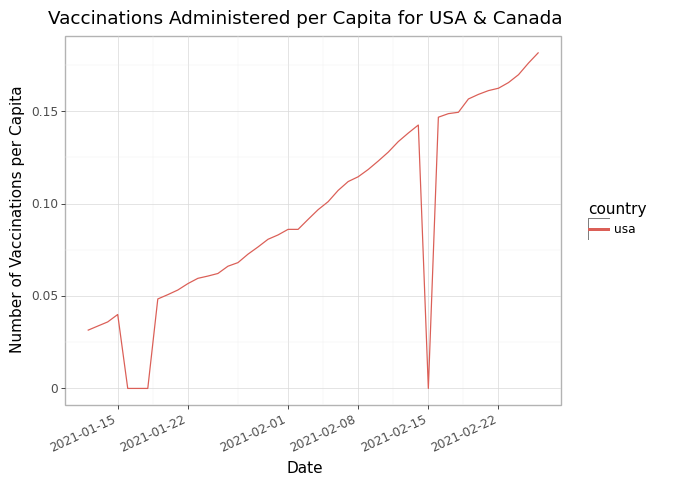

<ggplot: (273995352)>

In [30]:
ggplot(data[data['location']=='Texas'].groupby(['country','date']).apply(lambda x:np.sum(x['total_vaccinations_raw'])/np.sum(x['pop_est'])).reset_index().rename(columns={0:'num_vaccines_per_capita'}))+\
aes(x='date',y='num_vaccines_per_capita')+\
ggtitle('Vaccinations Administered per Capita for USA & Canada')+\
ylab('Number of Vaccinations per Capita')+\
xlab('Date')+\
geom_line(aes(color='country'))+\
theme_light()+\
theme(axis_text_x=element_text(rotation=25,hjust=1))

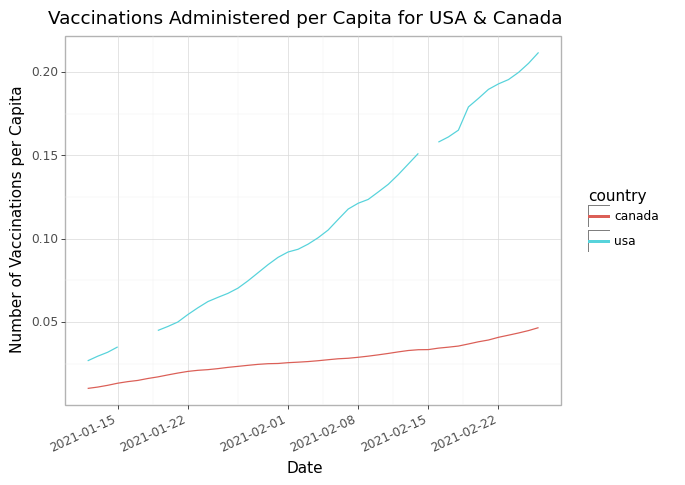

<ggplot: (321012947)>

In [32]:
ggplot(data.groupby(['country','date']).apply(lambda x:np.sum(x['total_vaccinations_raw'])/np.sum(x['pop_est'])).reset_index().rename(columns={0:'num_vaccines_per_capita'}).replace(0,np.NaN))+\
aes(x='date',y='num_vaccines_per_capita')+\
ggtitle('Vaccinations Administered per Capita for USA & Canada')+\
ylab('Number of Vaccinations per Capita')+\
xlab('Date')+\
geom_line(aes(color='country'))+\
theme_light()+\
theme(axis_text_x=element_text(rotation=25,hjust=1))

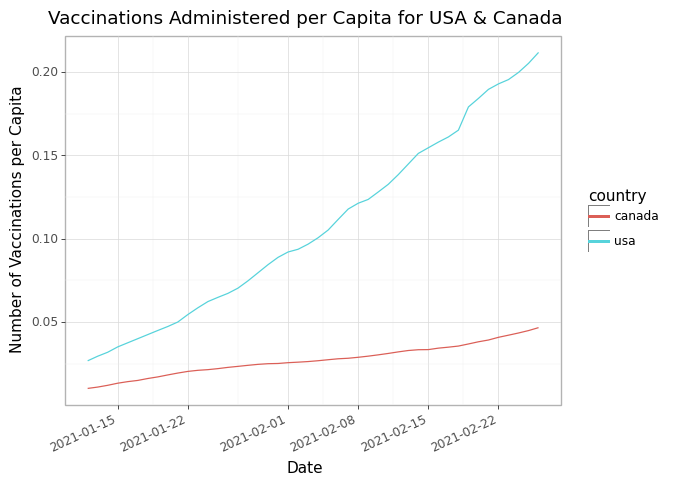

<ggplot: (320607934)>

In [10]:
ggplot(data.groupby(['country','date']).apply(lambda x:np.sum(x['total_vaccinations_int'])/np.sum(x['pop_est'])).reset_index().rename(columns={0:'num_vaccines_per_capita'}))+\
aes(x='date',y='num_vaccines_per_capita')+\
ggtitle('Vaccinations Administered per Capita for USA & Canada')+\
ylab('Number of Vaccinations per Capita')+\
xlab('Date')+\
geom_line(aes(color='country'))+\
theme_light()+\
theme(axis_text_x=element_text(rotation=25,hjust=1))

Examining the plot above, we see that even after adjusting for the US's larger population, the differential in the number of vaccines administered between the US and Canada is not only very large, but has been growing over time -- whereas the gap in mid-January was only around 0.025 vaccinations per capita, the current gap is over 0.15 vaccinations per capita, with the United States leading.

While this plot reveals a large overall differential, we also want to examine whether there is a difference in the distribution of the number of vaccinations per capita across states/provinces within each country. We plot the distributions of the latest available data using a kernel density estimator below:

In [11]:
latest_data=data[data['date']==np.max(data['date'])]
latest_data['num_vaccines_per_capita']=latest_data[['total_vaccinations_int','pop_est']].apply(lambda x:x[0]/x[1],axis=1)
latest_data['log_pop_est']=np.log(latest_data['pop_est'])
latest_data.head()

<ipython-input-11-2c01907b42e1>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
<ipython-input-11-2c01907b42e1>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


,date,location,country,total_vaccinations_raw,total_distributed_raw,pop_est,division,total_vaccinations_int,total_distributed_int,daily_vaccinations_int,daily_distributed_int,daily_vaccinations_rolling,daily_distributed_rolling,num_vaccines_per_capita,log_pop_est
45,2021-02-26,Alabama,usa,893859.00000,1380380.00000,4904042.08508,East South Central,893859.00000,1380380.00000,29102.00000,210260.00000,22103.85714,43254.28571,0.18227,15.40557
91,2021-02-26,Alaska,usa,254334.00000,332415.00000,731528.80453,Pacific,254334.00000,332415.00000,4775.00000,13150.00000,5444.42857,4640.00000,0.34767,13.50289
137,2021-02-26,Arizona,usa,1671294.00000,2143135.00000,7278188.13041,Mountain,1671294.00000,2143135.00000,63750.00000,78870.00000,42127.00000,66280.00000,0.22963,15.80039
183,2021-02-26,Arkansas,usa,597990.00000,861230.00000,3017641.27455,West South Central,597990.00000,861230.00000,25437.00000,35100.00000,11531.28571,24243.57143,0.19816,14.91999
229,2021-02-26,California,usa,8310945.00000,11297300.00000,39502027.02103,Pacific,8310945.00000,11297300.00000,246824.00000,340390.00000,192334.57143,304738.57143,0.21039,17.49186


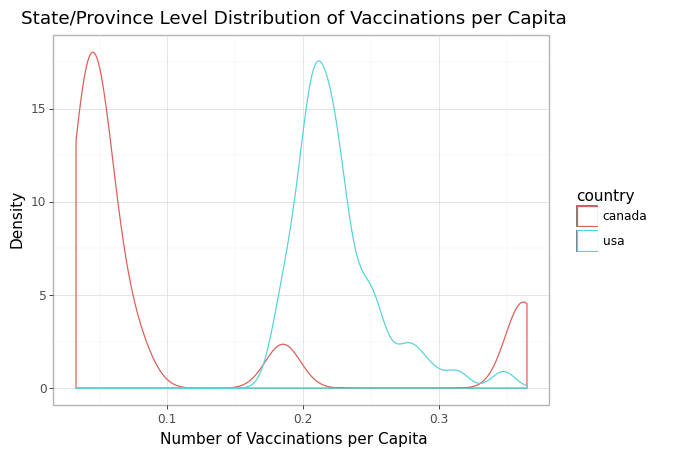

<ggplot: (274037023)>

In [12]:
ggplot(latest_data,aes(x='num_vaccines_per_capita'))+\
geom_density(aes(color='country'))+\
ggtitle('State/Province Level Distribution of Vaccinations per Capita')+\
ylab('Density')+\
xlab('Number of Vaccinations per Capita')+\
theme_light()

Examining this plot, we notice an interesting pattern. Whereas the distribution of vaccines per capita among states in the US is unimodal with a slight long right hand tail, the distribution among provinces in Canada is trimodal, with the largest peak centered under 0.05 and two small peaks near 0.2 and 0.35. In order to further examine this odd distribution, we will create a bar plot comparing the vaccinations per capita across provinces in Canada:

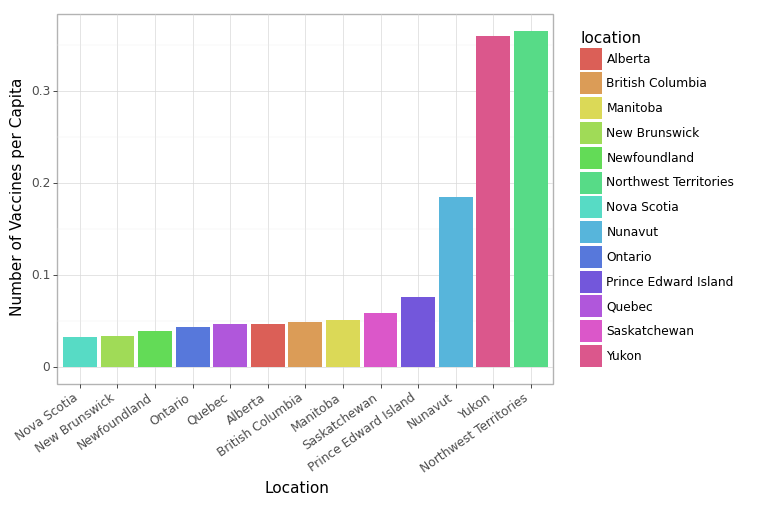

<ggplot: (320749508)>

In [13]:
ggplot(latest_data[latest_data['country']=='canada'],aes(y='num_vaccines_per_capita',x='location'))+\
geom_bar(aes(fill='location'),stat='identity')+\
scale_x_discrete(limits=latest_data[latest_data['country']=='canada'].sort_values('num_vaccines_per_capita')['location'].values)+\
ggtitle('')+\
ylab('Number of Vaccines per Capita')+\
xlab('Location')+\
theme_light()+\
theme(axis_text_x=element_text(rotation=35,hjust=1))

Examining this plot, we can better make sense of the 3 peaks observered in the distribution above. The majority of provinces in Canada make up the large leftmost peak, while the first of the two leftmost peaks includes only Nunavut, and the second includes Yukon and Northwest Territories.

Thinking futher about this, the well-performing provinces seem to all be made up of territories with relatively small populations. We can further investigate this relationship by plotting vaccinations per capita against a province's population:

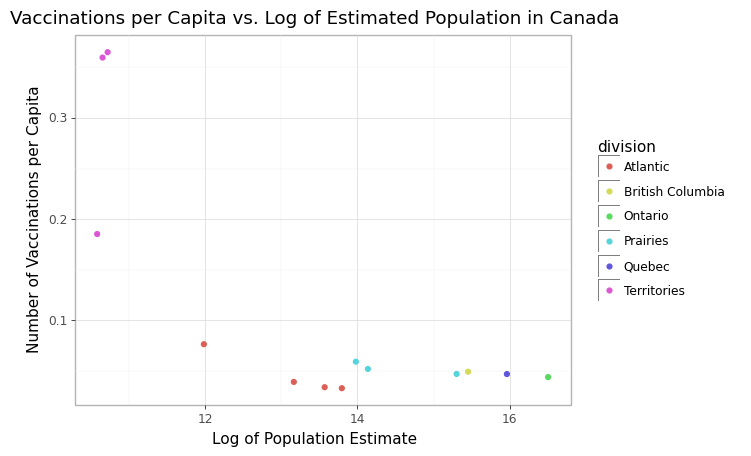

<ggplot: (320850387)>

In [14]:
ggplot(latest_data[latest_data['country']=='canada'],aes(y='num_vaccines_per_capita',x='log_pop_est'))+\
geom_point(aes(color='division'))+\
ggtitle('Vaccinations per Capita vs. Log of Estimated Population in Canada')+\
ylab('Number of Vaccinations per Capita')+\
xlab('Log of Population Estimate')+\
theme_light()

Based on the scatter plot above, we see that the 3 overperforming provinces are all territories which are clustered around a similar population that is much smaller than the next smallest province. Interestingly, there does not seem to be a correlation between vaccinations per capita and population for provinces outside of this cluster.

We can repeat this analysis for the USA to determine if similar trends exist:

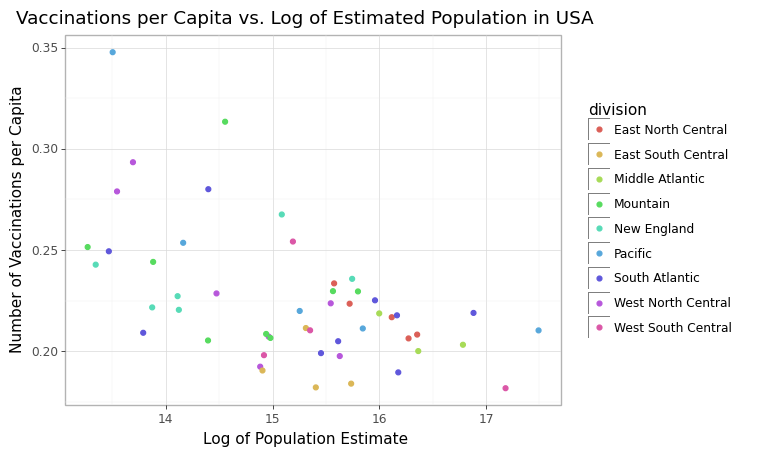

<ggplot: (320790041)>

In [15]:
ggplot(latest_data[latest_data['country']=='usa'],aes(y='num_vaccines_per_capita',x='log_pop_est'))+\
geom_point(aes(color='division'))+\
ggtitle('Vaccinations per Capita vs. Log of Estimated Population in USA')+\
ylab('Number of Vaccinations per Capita')+\
xlab('Log of Population Estimate')+\
theme_light()

Based on this plot, it seems that there is somewhat of a negative linear relationship between # of vaccines per capita and population for states in the USA for lower-population states (albeit a fairly weak one), however this does not seem to be the case for larger population states. There do not seem to be obvious trends relating to census division. This is interesting in that both the US and Canada seem to exhibit a negative association between a state/province's population and its vaccinations per capita for small states/provinces, with this relationship disappearing for larger ones.

## Vaccination Maps
**Research question: What geographic pattern exist in vaccination rates? Are the differences between the US and Canada explained by some underlying geographical pattern? Are there any similarities between the distribution of vaccination rates between the two countries?**

One powerful way of visualizing the geographic differences in vaccination rates is by plotting them on a map. We can encode the progress of each province and state with a color shade and plot them all on the same map.

In [16]:
# Filter the data to only include the most recent date, which is 
# the most relevant for a single map of the cumulative vaccination numbers
max_date_df = data[data.groupby('location').date.transform('max') == data['date']]

In [17]:
max_date_df['per_100_raw'] = 100*max_date_df['total_vaccinations_raw']/max_date_df['pop_est']
max_date_df.head()

<ipython-input-17-72f9091bebf6>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


,date,location,country,total_vaccinations_raw,total_distributed_raw,pop_est,division,total_vaccinations_int,total_distributed_int,daily_vaccinations_int,daily_distributed_int,daily_vaccinations_rolling,daily_distributed_rolling,per_100_raw
45,2021-02-26,Alabama,usa,893859.00000,1380380.00000,4904042.08508,East South Central,893859.00000,1380380.00000,29102.00000,210260.00000,22103.85714,43254.28571,18.22698
91,2021-02-26,Alaska,usa,254334.00000,332415.00000,731528.80453,Pacific,254334.00000,332415.00000,4775.00000,13150.00000,5444.42857,4640.00000,34.76746
137,2021-02-26,Arizona,usa,1671294.00000,2143135.00000,7278188.13041,Mountain,1671294.00000,2143135.00000,63750.00000,78870.00000,42127.00000,66280.00000,22.96305
183,2021-02-26,Arkansas,usa,597990.00000,861230.00000,3017641.27455,West South Central,597990.00000,861230.00000,25437.00000,35100.00000,11531.28571,24243.57143,19.81647
229,2021-02-26,California,usa,8310945.00000,11297300.00000,39502027.02103,Pacific,8310945.00000,11297300.00000,246824.00000,340390.00000,192334.57143,304738.57143,21.03929


Now we can plot the population-adjusted vaccination rate on a map.

In [18]:
per_100_raw_map = folium.Map(location=[58, -102], tiles="cartodbpositron", zoom_start=3)

folium.Choropleth(
    geo_data=us_canada_json,
    name="choropleth",
    data=max_date_df,
    columns=["location", "per_100_raw"],
    key_on="feature.properties.name",
    fill_color="Greens",
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name="total_vaccinations_raw",
).add_to(per_100_raw_map)

folium.LayerControl().add_to(per_100_raw_map)

per_100_raw_map

There are two immediately apparent observations that can be made from the above map. First, is the stark difference between the provinces of Canada and the contiguous US states: Canada's most populated areas are clearly lagging behind most of the United States. Second, the most well-vaccinated areas overall are the most northern regions. Alaska, the Yukon, and the Northwest Territories have among the highest rates overall, and Nunavut is also doing doing better than any of the provinces. This is likely due to the prioritization of remote areas without ready access to advanced healthcare facilities or with very limited ICUs capacity. These three groups reflect the distribtuions seen in the density plots for the two countries above.

While it's clear that Canada's provinces are doing poorly overall, any differences between them are washed out with this color scale, let's subset the provinces and see what geographical differences exist across Canada's most populated areas.

In [19]:
# Filter the per_100 data for the Canadian provinces only, to show the differences there
provinces_list = ['Alberta','British Columbia','Manitoba','New Brunswick','Newfoundland',
             'Nova Scotia','Ontario','Prince Edward Island','Quebec','Saskatchewan']
max_date_provinces_df = max_date_df[max_date_df.location.isin(provinces_list)]
max_date_provinces_df

,date,location,country,total_vaccinations_raw,total_distributed_raw,pop_est,division,total_vaccinations_int,total_distributed_int,daily_vaccinations_int,daily_distributed_int,daily_vaccinations_rolling,daily_distributed_rolling,per_100_raw
2391,2021-02-26,Alberta,canada,207300.00000,274965.00000,4428112.00000,Prairies,207300.00000,274965.00000,11728.00000,69090.00000,6696.71429,9870.00000,4.68145
2437,2021-02-26,British Columbia,canada,252373.00000,323340.00000,5145851.00000,British Columbia,252373.00000,323340.00000,12490.00000,15491.00000,8490.14286,11407.14286,4.90440
2483,2021-02-26,Manitoba,canada,71469.00000,108460.00000,1379584.00000,Prairies,71469.00000,108460.00000,2409.00000,6100.00000,1785.00000,3378.57143,5.18047
2529,2021-02-26,New Brunswick,canada,26317.00000,46775.00000,781315.00000,Atlantic,26317.00000,46775.00000,0.00000,11760.00000,733.57143,1680.00000,3.36830
2575,2021-02-26,Newfoundland,canada,20285.00000,33820.00000,520998.00000,Atlantic,20285.00000,33820.00000,0.00000,7020.00000,546.71429,1337.14286,3.89349
2621,2021-02-26,Nova Scotia,canada,32019.00000,61980.00000,979115.00000,Atlantic,32019.00000,61980.00000,1271.00000,14700.00000,998.14286,2100.00000,3.27020
2759,2021-02-26,Ontario,canada,643765.00000,903285.00000,14733119.00000,Ontario,643765.00000,903285.00000,21805.00000,220030.00000,17847.28571,31432.85714,4.36951
2805,2021-02-26,Prince Edward Island,canada,12176.00000,14715.00000,159713.00000,Atlantic,12176.00000,14715.00000,0.00000,1670.00000,212.14286,238.57143,7.62367
2851,2021-02-26,Quebec,canada,400540.00000,537825.00000,8575779.00000,Quebec,400540.00000,537825.00000,13464.00000,28500.00000,12698.42857,19448.57143,4.67060
2897,2021-02-26,Saskatchewan,canada,69451.00000,74605.00000,1177884.00000,Prairies,69451.00000,74605.00000,4015.00000,15210.00000,2345.85714,2172.85714,5.89625


In [20]:
per_100_provinces_map = folium.Map(location=[53, -94], tiles="cartodbpositron", zoom_start=4)

folium.Choropleth(
    geo_data=us_canada_json,
    name="choropleth",
    data=max_date_provinces_df,
    columns=["location", "per_100_raw"],
    key_on="feature.properties.name",
    fill_color="Greens",
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name="total_vaccinations_raw",
).add_to(per_100_provinces_map)

folium.LayerControl().add_to(per_100_provinces_map)

per_100_provinces_map

Now we can see the differences between provinces, with BC leading he three most populated provinces, and PEI leading strongly overall.

In the two plots below, I looked to explore the total vaccinations per State, Province and Territory. In order to account for population, the second plot shows vaccinations per capita. 

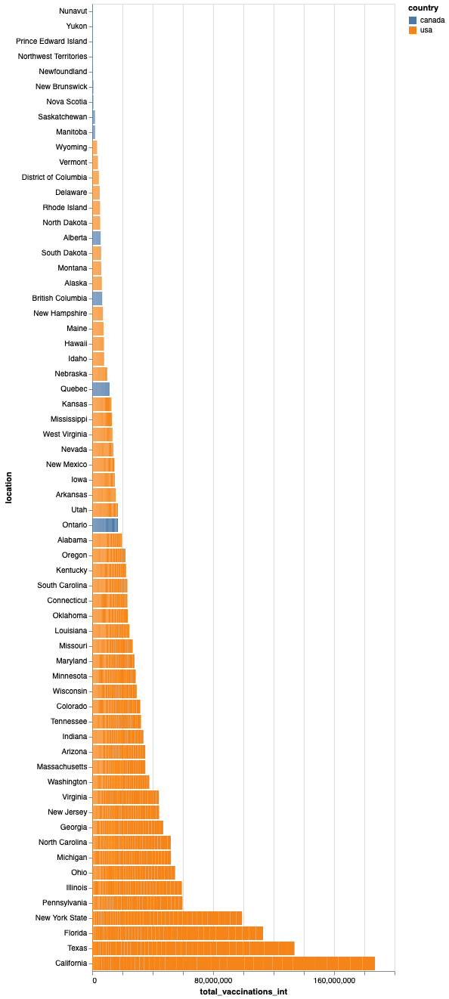

In [21]:
alt.Chart(data).mark_bar(filled=True).encode(
    x='total_vaccinations_int',
    y=alt.Y('location', sort='x'),
    color='country',
)

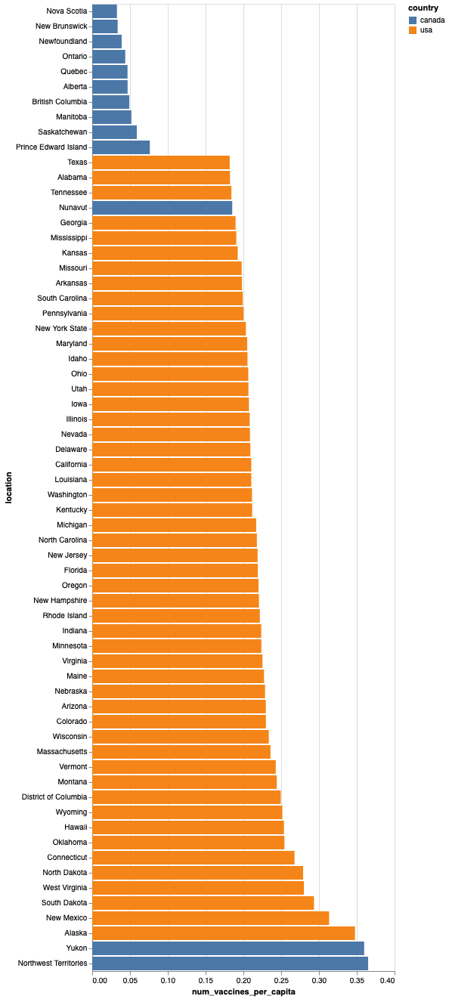

In [22]:
alt.Chart(latest_data).mark_bar(filled=True).encode(
    x='num_vaccines_per_capita',
    y=alt.Y('location', sort='x'),
    color='country',
)

In [23]:
## Compare vaccine rollout between regions (divisions)

data_div = data.groupby(['division','date', 'country']).apply(lambda x:np.sum(x['total_vaccinations_int'])/np.sum(x['pop_est'])).reset_index().rename(columns={})

data_div = data_div.rename(columns={0: 'div_vaccines_per_capita'})

data_div


,division,date,country,div_vaccines_per_capita
0,Atlantic,2021-01-12,canada,0.00801
1,Atlantic,2021-01-13,canada,0.00864
2,Atlantic,2021-01-14,canada,0.00899
3,Atlantic,2021-01-15,canada,0.01054
4,Atlantic,2021-01-16,canada,0.01054
...,...,...,...,...
685,West South Central,2021-02-22,usa,0.17335
686,West South Central,2021-02-23,usa,0.17614
687,West South Central,2021-02-24,usa,0.18058
688,West South Central,2021-02-25,usa,0.18688


Research question:

Now that we have considered State, Provincial and Territory analysis we thought about dividing geographically by regions to help clarify trends in the data. In response to the question, what are the regional differences in vaccination rates? We identified regions in the United States and Canada. The results of this grouping show three clear groups featured below. The bottom cluster of lines features Canadian provinces, meanwhile, the top line features Canadian territories. Lastly, the central cluster of lines represents the regions throughout the United States. The reason the Canadian territories have such a high rate of vaccination per capita, is because the Canadian government recognized the vulnerable status of indigenous populations there, and decided to prioritize vaccinating indigenous populations first. 

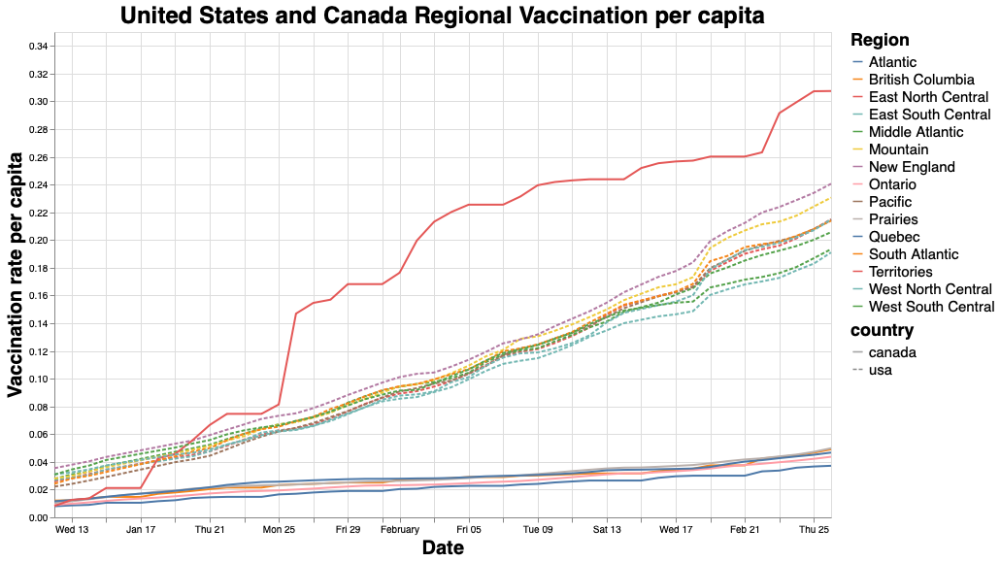

In [24]:
alt.Chart(data_div, title="United States and Canada Regional Vaccination per capita").mark_line().encode(
    alt.X('date:T',
         axis=alt.Axis(title='Date')),
    alt.Y('div_vaccines_per_capita:Q',
          axis=alt.Axis(title='Vaccination rate per capita')),
    color=alt.Color('division', legend=alt.Legend(title="Region")),
    strokeDash='country:N',
).properties(height=500, width=800).configure_legend(
titleFontSize=18,
labelFontSize=15
).configure_axis(
    labelFontSize=10,
    titleFontSize=20
).configure_title(fontSize=24)